In [5]:
project_name = 'art-dcgan'

In [6]:
!pip install opendatasets --upgrade --quiet

In [7]:
kaggle_api = {"username":"omshetye","key":"56d0f97036f37861d7c33add226ecdee"}

In [8]:
import opendatasets as od

dataset_url1 = 'https://www.kaggle.com/datasets/bryanb/abstract-art-gallery'
dataset_url2 = 'https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time'
od.download(dataset_url2)

Dataset URL: https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time


100%|██████████| 2.29G/2.29G [00:39<00:00, 63.0MB/s]


In [9]:
import os
data_dir = '/content/best-artworks-of-all-time/resized/'

In [10]:
for cls in os.listdir(data_dir):
  print(cls, ": ", len(os.listdir(data_dir + '/' + cls)))

resized :  8683


In [11]:
from torchvision.datasets import ImageFolder

In [12]:
dataset = ImageFolder(data_dir)

In [13]:
len(dataset)

8683

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline

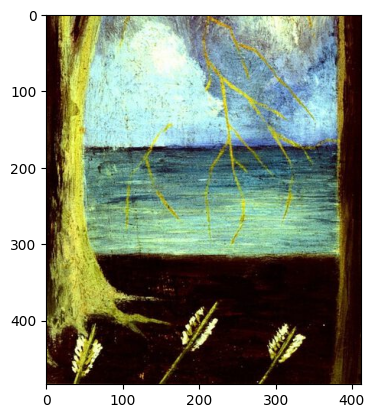

In [15]:
img, label = dataset[3029]
plt.imshow(img)

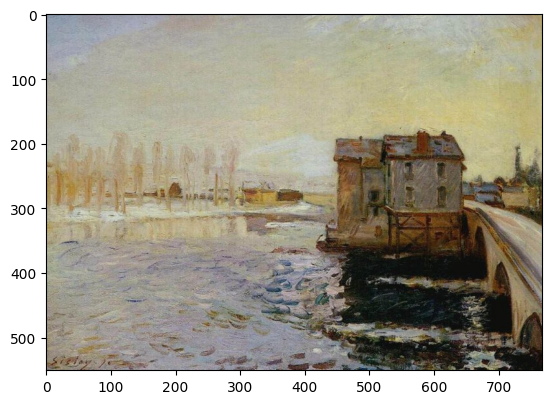

In [16]:
img, label = dataset[741]
plt.imshow(img)

In [17]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [18]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [19]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [20]:
from torchvision.utils import make_grid

In [21]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [22]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break


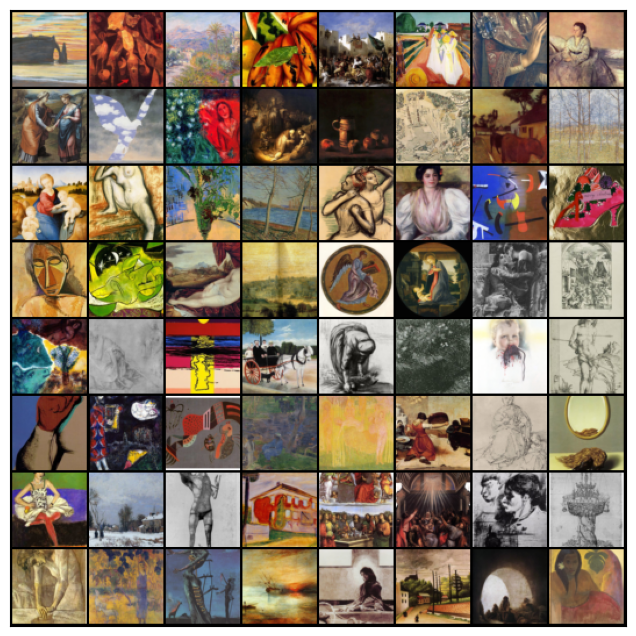

In [23]:
show_batch(train_dl)

In [24]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [25]:
import torch

In [26]:
device = get_default_device()
device

device(type='cuda')

In [27]:
train_dl = DeviceDataLoader(train_dl, device)

# Discriminator Network:

In [28]:
import torch.nn as nn

In [29]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [30]:
discriminator = to_device(discriminator, device)

# Generator Network:

In [31]:
latent_size = 128

In [32]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

Let's see how our first generative image look's like .


torch.Size([128, 3, 64, 64])


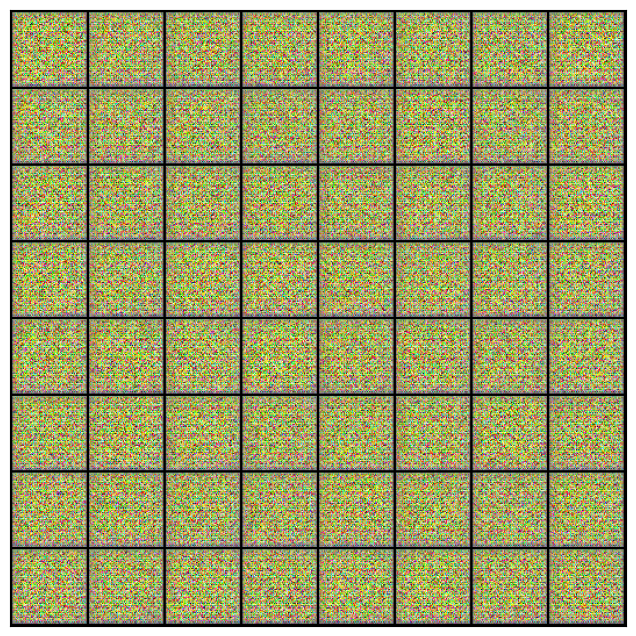

In [33]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [34]:
generator = to_device(generator, device)

# Discriminator Training
Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.
## Here are the steps involved in training the discriminator.


1.  We expect the discriminator to output 1 if the image was picked from the real artwork dataset, and 0 if it was generated using the generator network.
2.   We first pass a batch of real images, and compute the loss, setting the target labels to 1.
3. Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.
4. Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (opt_d only affects the discriminator.parameters())



In [35]:

def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [36]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [37]:
from torchvision.utils import save_image

In [38]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [39]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [40]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


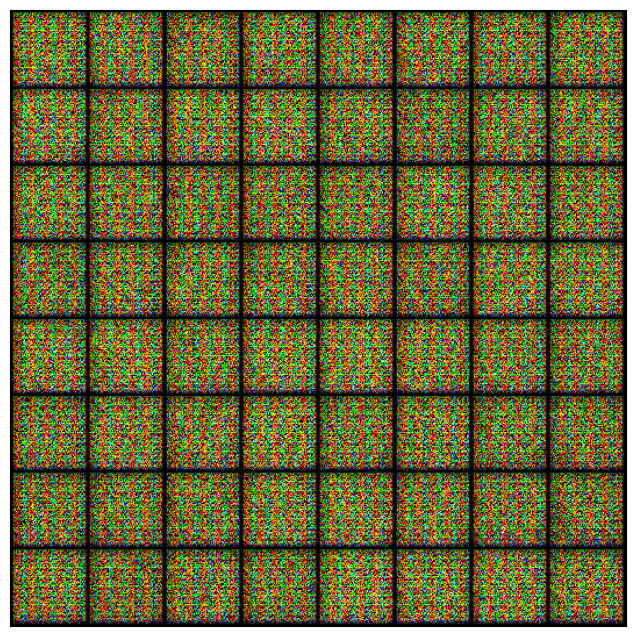

In [41]:
save_samples(0, fixed_latent)

In [42]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [43]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [44]:
lr = 0.0002
epochs = 120

In [45]:
history = fit(epochs, lr)

  0%|          | 0/68 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch [1/120], loss_g: 4.6655, loss_d: 0.6096, real_score: 0.6236, fake_score: 0.0191
Saving generated-images-0001.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [2/120], loss_g: 9.9458, loss_d: 1.5366, real_score: 0.9815, fake_score: 0.7519
Saving generated-images-0002.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [3/120], loss_g: 4.0376, loss_d: 0.3201, real_score: 0.8371, fake_score: 0.1165
Saving generated-images-0003.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [4/120], loss_g: 6.0687, loss_d: 1.0329, real_score: 0.8591, fake_score: 0.5479
Saving generated-images-0004.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [5/120], loss_g: 2.4171, loss_d: 0.7475, real_score: 0.7028, fake_score: 0.2569
Saving generated-images-0005.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [6/120], loss_g: 2.5158, loss_d: 1.2191, real_score: 0.7856, fake_score: 0.5805
Saving generated-images-0006.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [7/120], loss_g: 2.2173, loss_d: 0.4926, real_score: 0.8726, fake_score: 0.2610
Saving generated-images-0007.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [8/120], loss_g: 2.6351, loss_d: 0.3471, real_score: 0.7663, fake_score: 0.0605
Saving generated-images-0008.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [9/120], loss_g: 2.4297, loss_d: 0.8593, real_score: 0.6220, fake_score: 0.2373
Saving generated-images-0009.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [10/120], loss_g: 2.3134, loss_d: 1.4225, real_score: 0.3257, fake_score: 0.0087
Saving generated-images-0010.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [11/120], loss_g: 3.8029, loss_d: 0.5083, real_score: 0.8651, fake_score: 0.2799
Saving generated-images-0011.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [12/120], loss_g: 5.6574, loss_d: 0.6484, real_score: 0.9601, fake_score: 0.4006
Saving generated-images-0012.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [13/120], loss_g: 2.5580, loss_d: 0.9873, real_score: 0.4500, fake_score: 0.0179
Saving generated-images-0013.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [14/120], loss_g: 6.1985, loss_d: 0.5653, real_score: 0.8788, fake_score: 0.3164
Saving generated-images-0014.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [15/120], loss_g: 3.5334, loss_d: 0.4977, real_score: 0.7970, fake_score: 0.1921
Saving generated-images-0015.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [16/120], loss_g: 4.1041, loss_d: 0.8032, real_score: 0.7393, fake_score: 0.3339
Saving generated-images-0016.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [17/120], loss_g: 0.9502, loss_d: 1.1806, real_score: 0.3928, fake_score: 0.0779
Saving generated-images-0017.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [18/120], loss_g: 3.3685, loss_d: 0.4760, real_score: 0.8738, fake_score: 0.2637
Saving generated-images-0018.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [19/120], loss_g: 2.5587, loss_d: 0.5636, real_score: 0.7157, fake_score: 0.1647
Saving generated-images-0019.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [20/120], loss_g: 3.5832, loss_d: 0.7187, real_score: 0.9176, fake_score: 0.4280
Saving generated-images-0020.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [21/120], loss_g: 4.3549, loss_d: 0.4669, real_score: 0.9503, fake_score: 0.3147
Saving generated-images-0021.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [22/120], loss_g: 2.5587, loss_d: 0.5105, real_score: 0.7551, fake_score: 0.1494
Saving generated-images-0022.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [23/120], loss_g: 3.4705, loss_d: 0.5542, real_score: 0.7884, fake_score: 0.2263
Saving generated-images-0023.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [24/120], loss_g: 3.1653, loss_d: 0.4663, real_score: 0.7813, fake_score: 0.1594
Saving generated-images-0024.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [25/120], loss_g: 7.0833, loss_d: 0.8651, real_score: 0.9378, fake_score: 0.5050
Saving generated-images-0025.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [26/120], loss_g: 4.4950, loss_d: 0.3729, real_score: 0.9297, fake_score: 0.2371
Saving generated-images-0026.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [27/120], loss_g: 2.6700, loss_d: 0.3732, real_score: 0.8299, fake_score: 0.1397
Saving generated-images-0027.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [28/120], loss_g: 3.3760, loss_d: 0.4542, real_score: 0.7745, fake_score: 0.0975
Saving generated-images-0028.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [29/120], loss_g: 5.2034, loss_d: 0.3288, real_score: 0.7708, fake_score: 0.0281
Saving generated-images-0029.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [30/120], loss_g: 4.9029, loss_d: 0.4399, real_score: 0.8585, fake_score: 0.2149
Saving generated-images-0030.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [31/120], loss_g: 3.7912, loss_d: 0.5310, real_score: 0.6795, fake_score: 0.0701
Saving generated-images-0031.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [32/120], loss_g: 3.0615, loss_d: 0.4605, real_score: 0.6865, fake_score: 0.0226
Saving generated-images-0032.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [33/120], loss_g: 3.9762, loss_d: 0.3638, real_score: 0.8502, fake_score: 0.1650
Saving generated-images-0033.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [34/120], loss_g: 4.2911, loss_d: 0.3423, real_score: 0.9103, fake_score: 0.2036
Saving generated-images-0034.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [35/120], loss_g: 10.6520, loss_d: 1.6528, real_score: 0.9956, fake_score: 0.7500
Saving generated-images-0035.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [36/120], loss_g: 7.0680, loss_d: 0.6918, real_score: 0.9603, fake_score: 0.4381
Saving generated-images-0036.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [37/120], loss_g: 3.4234, loss_d: 0.2477, real_score: 0.8433, fake_score: 0.0483
Saving generated-images-0037.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [38/120], loss_g: 4.0738, loss_d: 0.5086, real_score: 0.7644, fake_score: 0.1809
Saving generated-images-0038.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [39/120], loss_g: 4.7700, loss_d: 0.7995, real_score: 0.7089, fake_score: 0.3031
Saving generated-images-0039.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [40/120], loss_g: 3.5976, loss_d: 0.4936, real_score: 0.6548, fake_score: 0.0121
Saving generated-images-0040.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [41/120], loss_g: 4.1689, loss_d: 0.2749, real_score: 0.8422, fake_score: 0.0843
Saving generated-images-0041.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [42/120], loss_g: 3.5942, loss_d: 0.1973, real_score: 0.9406, fake_score: 0.1178
Saving generated-images-0042.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [43/120], loss_g: 3.5207, loss_d: 0.2900, real_score: 0.8865, fake_score: 0.1424
Saving generated-images-0043.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [44/120], loss_g: 2.6943, loss_d: 0.3126, real_score: 0.8725, fake_score: 0.1435
Saving generated-images-0044.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [45/120], loss_g: 8.4368, loss_d: 1.0993, real_score: 0.9790, fake_score: 0.5857
Saving generated-images-0045.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [46/120], loss_g: 3.1506, loss_d: 0.3493, real_score: 0.8803, fake_score: 0.1818
Saving generated-images-0046.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [47/120], loss_g: 3.9227, loss_d: 0.3038, real_score: 0.9443, fake_score: 0.2028
Saving generated-images-0047.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [48/120], loss_g: 2.9429, loss_d: 0.3552, real_score: 0.7711, fake_score: 0.0649
Saving generated-images-0048.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [49/120], loss_g: 3.4970, loss_d: 0.3639, real_score: 0.8105, fake_score: 0.1167
Saving generated-images-0049.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [50/120], loss_g: 8.0787, loss_d: 1.6075, real_score: 0.9717, fake_score: 0.7504
Saving generated-images-0050.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [51/120], loss_g: 3.8085, loss_d: 1.0612, real_score: 0.4135, fake_score: 0.0042
Saving generated-images-0051.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [52/120], loss_g: 4.6944, loss_d: 0.5542, real_score: 0.9514, fake_score: 0.3601
Saving generated-images-0052.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [53/120], loss_g: 1.9239, loss_d: 0.3011, real_score: 0.8113, fake_score: 0.0741
Saving generated-images-0053.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [54/120], loss_g: 5.2024, loss_d: 0.5432, real_score: 0.9343, fake_score: 0.3366
Saving generated-images-0054.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [55/120], loss_g: 6.2060, loss_d: 0.8470, real_score: 0.9778, fake_score: 0.4929
Saving generated-images-0055.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [56/120], loss_g: 5.1718, loss_d: 0.8280, real_score: 0.9752, fake_score: 0.4882
Saving generated-images-0056.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [57/120], loss_g: 7.6309, loss_d: 0.1687, real_score: 0.8571, fake_score: 0.0068
Saving generated-images-0057.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [58/120], loss_g: 4.4634, loss_d: 0.1078, real_score: 0.9487, fake_score: 0.0509
Saving generated-images-0058.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [59/120], loss_g: 5.6418, loss_d: 0.3829, real_score: 0.9440, fake_score: 0.2507
Saving generated-images-0059.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [60/120], loss_g: 1.3392, loss_d: 0.4646, real_score: 0.6852, fake_score: 0.0519
Saving generated-images-0060.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [61/120], loss_g: 5.0702, loss_d: 0.6078, real_score: 0.9839, fake_score: 0.4027
Saving generated-images-0061.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [62/120], loss_g: 3.7608, loss_d: 0.3341, real_score: 0.8984, fake_score: 0.1859
Saving generated-images-0062.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [63/120], loss_g: 2.6421, loss_d: 1.0236, real_score: 0.4574, fake_score: 0.0123
Saving generated-images-0063.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [64/120], loss_g: 5.0414, loss_d: 0.1498, real_score: 0.9055, fake_score: 0.0444
Saving generated-images-0064.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [65/120], loss_g: 3.0268, loss_d: 0.4450, real_score: 0.9315, fake_score: 0.2843
Saving generated-images-0065.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [66/120], loss_g: 5.8659, loss_d: 0.4813, real_score: 0.9916, fake_score: 0.3413
Saving generated-images-0066.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [67/120], loss_g: 4.1427, loss_d: 0.2748, real_score: 0.9635, fake_score: 0.1878
Saving generated-images-0067.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [68/120], loss_g: 2.2141, loss_d: 0.5219, real_score: 0.6277, fake_score: 0.0113
Saving generated-images-0068.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [69/120], loss_g: 6.2404, loss_d: 0.4849, real_score: 0.9966, fake_score: 0.3445
Saving generated-images-0069.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [70/120], loss_g: 2.5243, loss_d: 0.4797, real_score: 0.6769, fake_score: 0.0389
Saving generated-images-0070.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [71/120], loss_g: 4.9326, loss_d: 0.2494, real_score: 0.9079, fake_score: 0.1229
Saving generated-images-0071.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [72/120], loss_g: 3.9968, loss_d: 1.1353, real_score: 0.4091, fake_score: 0.0066
Saving generated-images-0072.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [73/120], loss_g: 3.6913, loss_d: 0.3629, real_score: 0.9157, fake_score: 0.2212
Saving generated-images-0073.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [74/120], loss_g: 3.9900, loss_d: 0.1860, real_score: 0.9906, fake_score: 0.1542
Saving generated-images-0074.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [75/120], loss_g: 4.1363, loss_d: 0.4865, real_score: 0.6771, fake_score: 0.0224
Saving generated-images-0075.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [76/120], loss_g: 4.7035, loss_d: 0.1965, real_score: 0.8659, fake_score: 0.0381
Saving generated-images-0076.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [77/120], loss_g: 0.6069, loss_d: 0.9136, real_score: 0.4849, fake_score: 0.0378
Saving generated-images-0077.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [78/120], loss_g: 4.8916, loss_d: 0.1529, real_score: 0.9415, fake_score: 0.0816
Saving generated-images-0078.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [79/120], loss_g: 5.2509, loss_d: 0.6938, real_score: 0.9640, fake_score: 0.4461
Saving generated-images-0079.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [80/120], loss_g: 2.3030, loss_d: 0.6647, real_score: 0.5813, fake_score: 0.0217
Saving generated-images-0080.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [81/120], loss_g: 3.2522, loss_d: 0.2828, real_score: 0.9586, fake_score: 0.1992
Saving generated-images-0081.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [82/120], loss_g: 2.0109, loss_d: 0.2481, real_score: 0.8531, fake_score: 0.0692
Saving generated-images-0082.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [83/120], loss_g: 2.8479, loss_d: 0.2906, real_score: 0.8192, fake_score: 0.0677
Saving generated-images-0083.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [84/120], loss_g: 4.2688, loss_d: 0.1373, real_score: 0.9919, fake_score: 0.1145
Saving generated-images-0084.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [85/120], loss_g: 3.4936, loss_d: 0.4791, real_score: 0.9130, fake_score: 0.2751
Saving generated-images-0085.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [86/120], loss_g: 3.4230, loss_d: 0.1373, real_score: 0.9727, fake_score: 0.0987
Saving generated-images-0086.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [87/120], loss_g: 2.4646, loss_d: 0.4085, real_score: 0.8174, fake_score: 0.1578
Saving generated-images-0087.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [88/120], loss_g: 4.2984, loss_d: 0.3185, real_score: 0.8462, fake_score: 0.1167
Saving generated-images-0088.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [89/120], loss_g: 5.6093, loss_d: 0.7628, real_score: 0.9932, fake_score: 0.4692
Saving generated-images-0089.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [90/120], loss_g: 2.9705, loss_d: 0.2099, real_score: 0.8905, fake_score: 0.0801
Saving generated-images-0090.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [91/120], loss_g: 5.0524, loss_d: 0.1043, real_score: 0.9722, fake_score: 0.0526
Saving generated-images-0091.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [92/120], loss_g: 3.2479, loss_d: 0.3261, real_score: 0.7445, fake_score: 0.0047
Saving generated-images-0092.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [93/120], loss_g: 2.3949, loss_d: 0.3671, real_score: 0.8019, fake_score: 0.1037
Saving generated-images-0093.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [94/120], loss_g: 0.7123, loss_d: 0.6962, real_score: 0.5609, fake_score: 0.0429
Saving generated-images-0094.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [95/120], loss_g: 2.5355, loss_d: 0.2921, real_score: 0.8823, fake_score: 0.1317
Saving generated-images-0095.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [96/120], loss_g: 4.4955, loss_d: 0.2984, real_score: 0.9611, fake_score: 0.1920
Saving generated-images-0096.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [97/120], loss_g: 1.5175, loss_d: 0.5413, real_score: 0.6289, fake_score: 0.0157
Saving generated-images-0097.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [98/120], loss_g: 4.0744, loss_d: 0.5523, real_score: 0.9618, fake_score: 0.3503
Saving generated-images-0098.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [99/120], loss_g: 4.0168, loss_d: 0.2098, real_score: 0.9680, fake_score: 0.1504
Saving generated-images-0099.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [100/120], loss_g: 2.9256, loss_d: 0.2080, real_score: 0.9020, fake_score: 0.0922
Saving generated-images-0100.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [101/120], loss_g: 3.9174, loss_d: 0.1115, real_score: 0.9474, fake_score: 0.0484
Saving generated-images-0101.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [102/120], loss_g: 4.1089, loss_d: 0.5708, real_score: 0.8797, fake_score: 0.2787
Saving generated-images-0102.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [103/120], loss_g: 0.8889, loss_d: 0.7832, real_score: 0.5361, fake_score: 0.0420
Saving generated-images-0103.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [104/120], loss_g: 3.4608, loss_d: 0.1689, real_score: 0.9439, fake_score: 0.0984
Saving generated-images-0104.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [105/120], loss_g: 2.4606, loss_d: 0.3876, real_score: 0.7476, fake_score: 0.0352
Saving generated-images-0105.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [106/120], loss_g: 4.3474, loss_d: 0.1790, real_score: 0.8569, fake_score: 0.0150
Saving generated-images-0106.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [107/120], loss_g: 6.6146, loss_d: 0.5100, real_score: 0.9928, fake_score: 0.3304
Saving generated-images-0107.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [108/120], loss_g: 0.2965, loss_d: 0.8469, real_score: 0.5050, fake_score: 0.0172
Saving generated-images-0108.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [109/120], loss_g: 3.8823, loss_d: 0.3711, real_score: 0.8266, fake_score: 0.1318
Saving generated-images-0109.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [110/120], loss_g: 3.9347, loss_d: 0.1345, real_score: 0.9432, fake_score: 0.0638
Saving generated-images-0110.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [111/120], loss_g: 6.3330, loss_d: 1.1287, real_score: 0.9936, fake_score: 0.5844
Saving generated-images-0111.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [112/120], loss_g: 3.0947, loss_d: 0.5445, real_score: 0.6424, fake_score: 0.0207
Saving generated-images-0112.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [113/120], loss_g: 3.9902, loss_d: 0.1031, real_score: 0.9295, fake_score: 0.0271
Saving generated-images-0113.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [114/120], loss_g: 4.3679, loss_d: 0.0602, real_score: 0.9813, fake_score: 0.0392
Saving generated-images-0114.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [115/120], loss_g: 4.8366, loss_d: 0.0981, real_score: 0.9166, fake_score: 0.0076
Saving generated-images-0115.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [116/120], loss_g: 2.1391, loss_d: 0.4874, real_score: 0.7449, fake_score: 0.1263
Saving generated-images-0116.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [117/120], loss_g: 1.9508, loss_d: 0.4986, real_score: 0.6606, fake_score: 0.0223
Saving generated-images-0117.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [118/120], loss_g: 4.3240, loss_d: 0.0817, real_score: 0.9617, fake_score: 0.0396
Saving generated-images-0118.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [119/120], loss_g: 5.6013, loss_d: 0.1254, real_score: 0.9169, fake_score: 0.0304
Saving generated-images-0119.png


  0%|          | 0/68 [00:00<?, ?it/s]

Epoch [120/120], loss_g: 4.5636, loss_d: 0.1285, real_score: 0.9650, fake_score: 0.0826
Saving generated-images-0120.png


In [46]:
losses_g, losses_d, real_scores, fake_scores = history


In [47]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [48]:
from IPython.display import Image


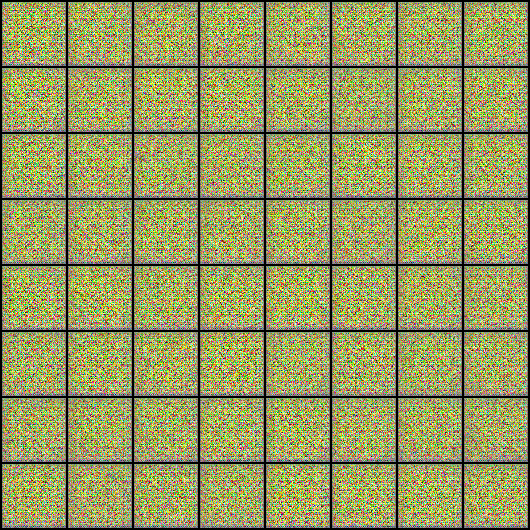

In [49]:
Image('/content/generated/generated-images-0000.png')

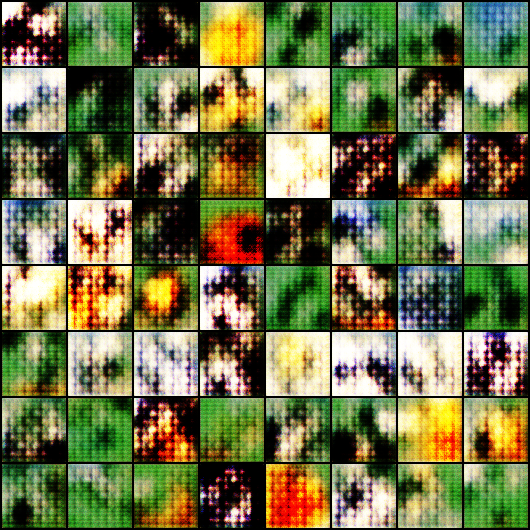

In [50]:
Image('/content/generated/generated-images-0010.png')

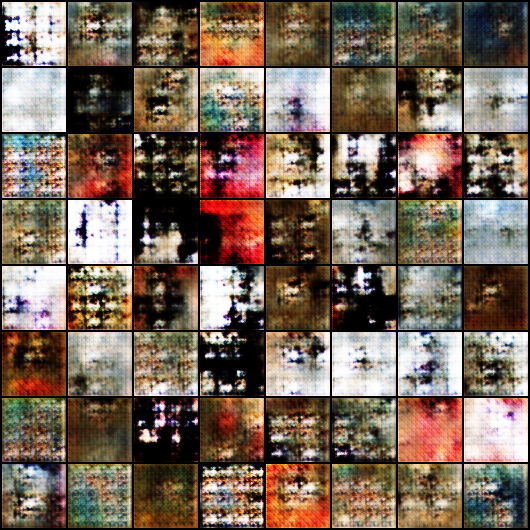

In [51]:
Image('/content/generated/generated-images-0020.png')

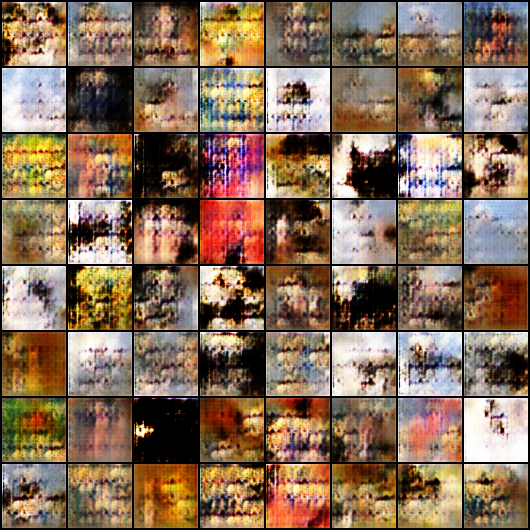

In [52]:
Image('/content/generated/generated-images-0030.png')

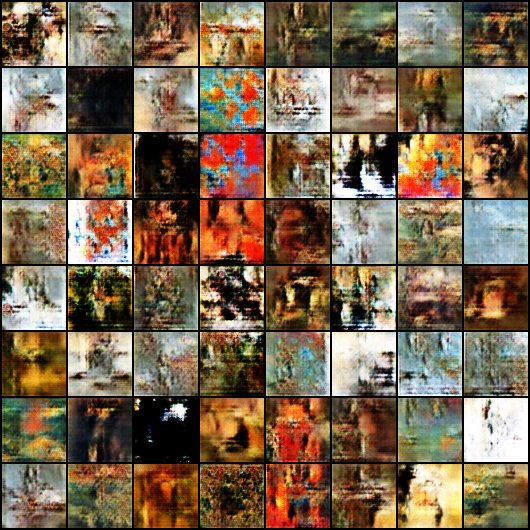

In [53]:
Image('/content/generated/generated-images-0040.png')

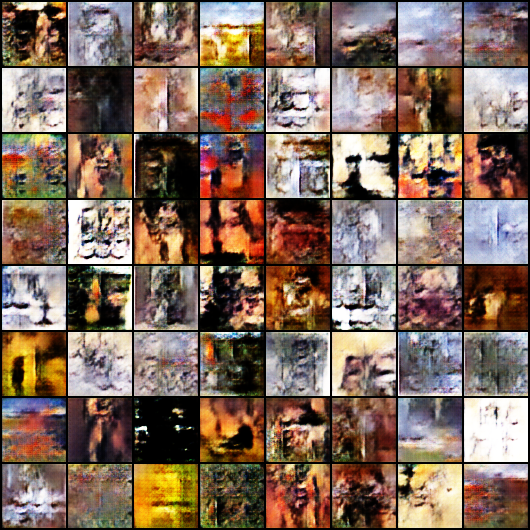

In [54]:
Image('/content/generated/generated-images-0050.png')

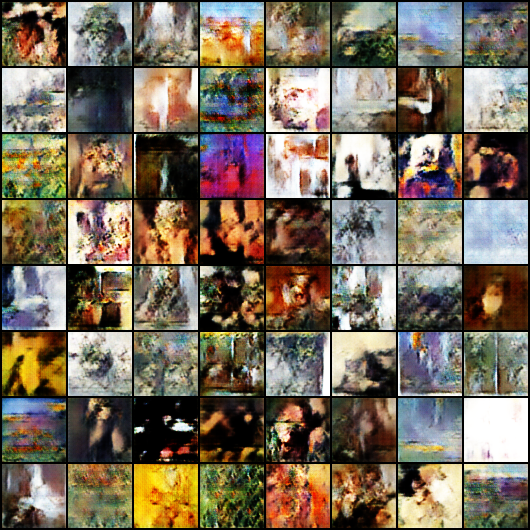

In [55]:
Image('/content/generated/generated-images-0060.png')

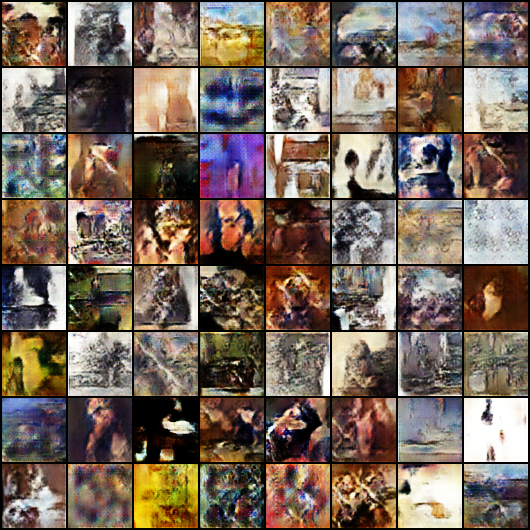

In [56]:
Image('/content/generated/generated-images-0070.png')

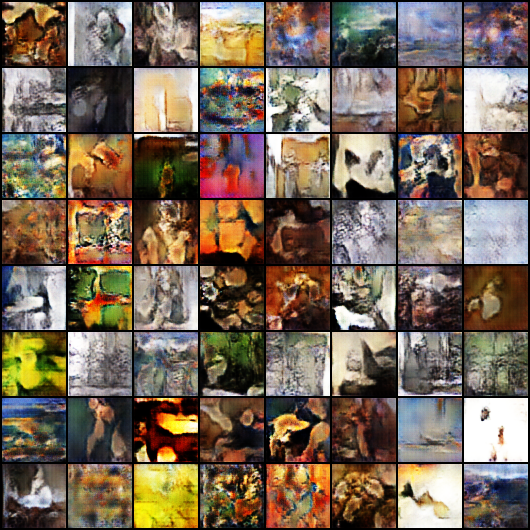

In [57]:
Image('/content/generated/generated-images-0080.png')

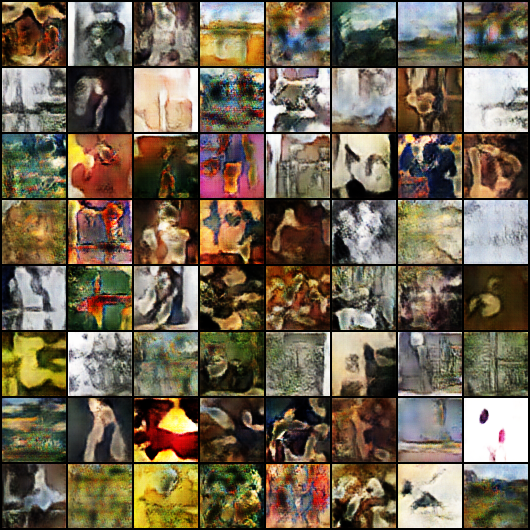

In [58]:
Image('/content/generated/generated-images-0090.png')

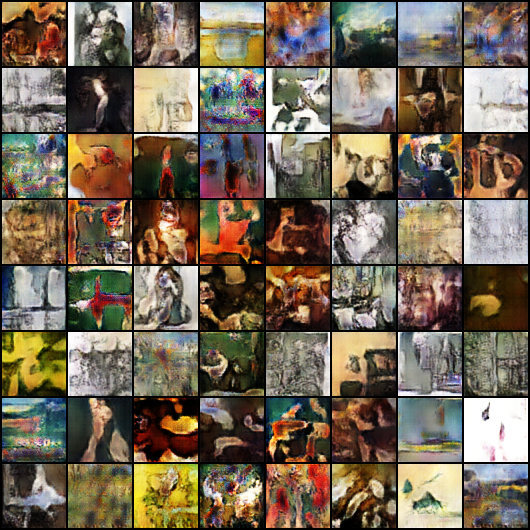

In [59]:
Image('/content/generated/generated-images-0100.png')

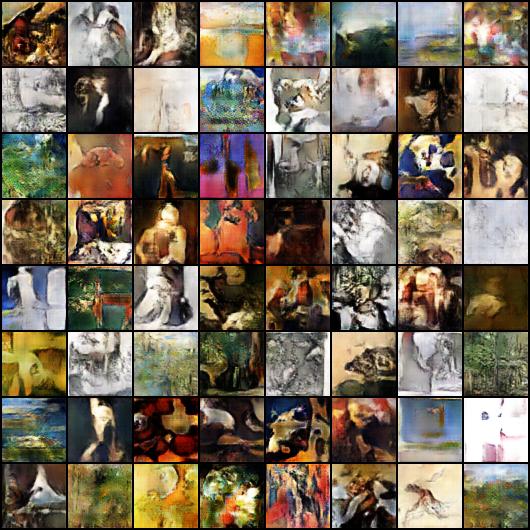

In [60]:
Image('/content/generated/generated-images-0120.png')

In [61]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

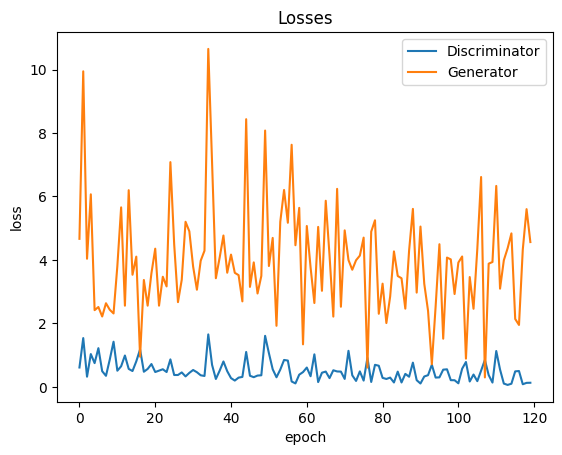

In [62]:

plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');


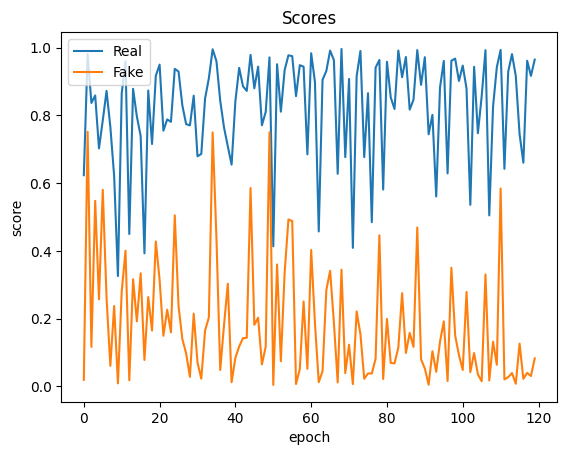

In [63]:

plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

In [64]:
import shutil

In [65]:
shutil.make_archive('generated', 'zip', 'generated')

'/content/generated.zip'

In [66]:
from google.colab import files
files.download('generated.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>